In [1]:
# from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import xarray as xr
import rioxarray as rxr
from pca import pca
import matplotlib 
%config InlineBackend.figure_formats = ['svg']

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
res = 'res2'
fname = 'env_var/factoryReef/'+res+'_photozoan.csv'

In [3]:
# df.photozoan.min()

In [4]:
df = pd.read_csv(fname)
df = df.where(df.photozoan==1).dropna()

In [5]:
df# df.y.values

,y,x,lat,lon,photozoan
33796,242.0,1176.0,-29.375,114.125,1.0
33797,242.0,1177.0,-29.375,114.375,1.0
33798,242.0,1178.0,-29.375,114.625,1.0
33799,242.0,1179.0,-29.375,114.875,1.0
33825,242.0,1391.0,-29.375,167.875,1.0
...,...,...,...,...,...
73012,479.0,384.0,29.875,-83.875,1.0
73013,479.0,385.0,29.875,-83.625,1.0
73303,481.0,849.0,30.375,32.375,1.0
74312,489.0,460.0,32.375,-64.875,1.0


In [7]:
ds = rxr.open_rasterio('env_var/bio_res2_0Ma_smooth/bathy.tif')
# ds

In [8]:
reefs = np.zeros(ds.shape[1:3])
reefs[df.y.values.astype(int),df.x.values.astype(int)] = 1
# plt.imshow(np.flipud(reefs))

gtmp = xr.DataArray(
                    reefs,
                    dims=["y", "x"],
                    coords={"y": ds.y.values, "x": ds.x.values},
                )
gtmp = gtmp.to_dataset(name='reef')
# gtmp.reef.plot()

In [9]:
# ds.isel(band=0).where(gtmp.reef>0).plot()

In [10]:
evars = ['bathy','curr','fstream','saltMax','saltMin','sed','tempMax','tempMin']

vals = []
for k in range(len(evars)):
    ds = rxr.open_rasterio('env_var/bio_res2_0Ma_smooth/'+evars[k]+'.tif')
    ds = ds.isel(band=0).where(gtmp.reef>0).to_dataframe(name=evars[k]).dropna()[evars[k]] #['y','x','band_data']
    vals.append(ds.to_frame()[evars[k]].values)
    
data = {'bathy': vals[0],'curr': vals[1],'fstream': vals[2],
        'saltMax': vals[3],'saltMin': vals[4],'sed': vals[5],
        'tempMax': vals[6],'tempMin': vals[7]
       }
df = pd.DataFrame(data)
# df
# df.to_csv('photozoan4PCA.csv',index=False)

In [63]:
df

,bathy,curr,fstream,saltMax,saltMin,sed,tempMax,tempMin
0,-173.361145,3.632803,-0.085183,34.623737,34.461366,259.999496,24.968074,19.895425
1,-59.781414,3.587682,-0.067886,34.649708,34.476068,265.722516,25.000198,19.906076
2,-48.624825,3.537822,-0.053573,34.676973,34.491431,271.431881,25.031421,19.913685
3,-157.586487,4.713017,-24.932746,34.117285,34.045895,160.399481,25.326848,19.329736
4,-218.530746,4.711760,-24.949651,34.120355,34.047599,160.785429,25.331191,19.309672
...,...,...,...,...,...,...,...,...
7433,-4.000636,3.479094,0.282798,36.579201,36.172929,1239.457633,30.830519,19.571887
7434,-7.156559,3.625358,0.304326,36.554624,36.157137,1209.012839,30.840097,19.612910
7435,-4.063153,3.788558,0.328271,36.532475,36.142318,1179.318086,30.847672,19.658074
7436,-429.841705,8.229512,20.213576,36.834715,36.527624,272.940886,29.868576,21.561668


In [ ]:
# fig, ax = plt.subplots(figsize=(20, 12))
# df.plot.hist(bins=50, cmap='Set1', ax=ax)
# ax.grid(True); ax.set_xlabel('Value')

In [ ]:
# model = pca(normalize=True)

In [11]:
model = pca(normalize=True, detect_outliers=['ht2', 'spe'])
# Fit transform data
results = model.fit_transform(df)
# Extract the most informative features
results['topfeat']

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [8] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [6] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [8] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[6]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


,PC,feature,loading,type
0,PC1,saltMin,0.543933,best
1,PC2,tempMax,-0.627554,best
2,PC3,fstream,0.647037,best
3,PC4,bathy,-0.668972,best
4,PC5,sed,0.813959,best
5,PC6,curr,0.650321,best
6,PC1,saltMax,0.506257,weak
7,PC1,tempMin,-0.467977,weak


In [12]:
# Make scatterplot
# model.scatter()

# Make scatterplot
# model.scatter(density=True)

# Gradient over the samples. High dense areas will be more colourful.
# model.scatter(gradient='#FFFFFF', edgecolor=None)

# Include the outlier detection
# model.scatter(SPE=True, density=True)

# Include the outlier detection
# model.scatter(HT2=True, density=True)

# Look at different PCs: 1st PC=1  vs PC=3
# model.scatter(PC=[0, 2])

In [13]:
# model.biplot(legend=True,SPE=True, HT2=True)


In [14]:
# model.biplot(cmap=None, legend=False)

(<Figure size 600x400 with 1 Axes>,
 <Axes: title={'center': 'Cumulative explained variance\n 6 Principal Components explain [99.76%] of the variance.'}, xlabel='Principle Component', ylabel='Percentage explained variance'>)

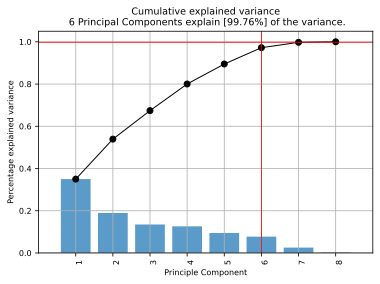

In [15]:
# fig = plt.figure(figsize=(8,5))

matplotlib.rcParams.update({'font.size': 8})
model.plot(figsize=(6,4))

# fig = plt.figure(figsize = (5,4))
# ax = fig.add_subplot(1,1,1) 
# ax.set_xlabel(fontsize = 7)
# ax.set_ylabel(fontsize = 7)
# ax.set_title(fontsize = 10)
# model.plot()
# ax.scatter(principalDf.loc[:, 'principal component 1']
#                , principalDf.loc[:, 'principal component 2']
# #                , c = color
#                , s = 50)

# for target, color in zip(targets,colors):
#     indicesToKeep = finalDf['target'] == target
#     ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
#                , finalDf.loc[indicesToKeep, 'principal component 2']
#                , c = color
#                , s = 50)
# ax.legend(targets)
# ax.grid()

In [57]:
import matplotlib.colors as mcolors
# cmap = plt.cm.get_cmap('tab20c', 3)
# Set colors
# color = cmap.colors[random_integers, 0:3]


matplotlib.rcParams.update({'font.size': 8})
matplotlib.rc('xtick', labelsize=6) 
matplotlib.rc('ytick', labelsize=6) 

fig = plt.figure(figsize = (6,6))
ax = fig.add_subplot(1,1,1) 
model.biplot(ax=ax,
#                         SPE=True,
                        HT2=False,
#                         c='seismic',
                        s=2,
                        marker='o',
                        alpha=0.2,
                        color_arrow='k',
#                         title='Demonstration of specifying colors, markers, alpha, and size per sample.',
                        n_feat=8,
                        fontsize=6,
                        fontweight='bold',
                        arrowdict={'fontsize': 8},
                        density=True,
                        density_on_top=True,
                         legend=False
             
                        )
# plt.xlabel("PC1", fontproperties={'size':'4'})
ax.title.set_fontsize(11)
ax.xaxis.label.set(fontsize=10)
ax.yaxis.label.set(fontsize=10)
plt.rcParams["font.size"] = "5"
plt.tick_params(labelsize=8)
for lab in ax.get_xticklabels():
    lab.set_fontweight('normal')
for lab in ax.get_yticklabels():
    lab.set_fontweight('normal')
ax.grid(True)
plt.legend(frameon=False)
# plt.show()
plt.savefig('PCAphotozoan.png',dpi=300)

[pca] >Plot PC1 vs PC2 with loadings.


[datazets] >WARNING> No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [62]:
import matplotlib.colors as mcolors
# cmap = plt.cm.get_cmap('tab20c', 3)
# Set colors
# color = cmap.colors[random_integers, 0:3]


matplotlib.rcParams.update({'font.size': 8})
matplotlib.rc('xtick', labelsize=6) 
matplotlib.rc('ytick', labelsize=6) 

fig = plt.figure(figsize = (6,6))
ax = fig.add_subplot(1,1,1) 
model.scatter(ax=ax,
#                         SPE=True,
                        HT2=False,
#                         c='seismic',
                        s=2,
                        marker='o',
                        alpha=0.2,
#                         color_arrow='k',
#                         title='Demonstration of specifying colors, markers, alpha, and size per sample.',
#                         n_feat=8,
                        fontsize=6,
                        fontweight='bold',
#                         arrowdict={'fontsize': 8},
                        density=True,
                        density_on_top=True,
                         legend=False
             
                        )
# plt.xlabel("PC1", fontproperties={'size':'4'})
ax.title.set_fontsize(11)
ax.xaxis.label.set(fontsize=10)
ax.yaxis.label.set(fontsize=10)
plt.rcParams["font.size"] = "5"
plt.tick_params(labelsize=8)
for lab in ax.get_xticklabels():
    lab.set_fontweight('normal')
for lab in ax.get_yticklabels():
    lab.set_fontweight('normal')
ax.grid(True)
plt.legend(frameon=False)
# plt.show()
plt.savefig('PCAphotozoan2.png',dpi=300)

[datazets] >WARNING> No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
